In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [2]:
from google.colab import files
data = files.upload()

Saving Dataset .csv to Dataset .csv


# Level 1

## Task 1: Data Exploration and Preprocessing

In [3]:
# create a dataframe from dataset
# Loading the Dataset
df = pd.read_csv("Dataset .csv")

In [4]:
# Check initial 5 records
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [5]:
# information of dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [6]:
df.shape[0]
df.shape[1]

21

In [7]:
# Display the number of rows and columns
print(f"Number of rows: {df.shape[0]}")
print(f"Number of columns: {df.shape[1]}")

Number of rows: 9551
Number of columns: 21


In [8]:
# Check for missing values
missing_values = df.isnull().sum()
print("Missing values per column:")
print(missing_values)

Missing values per column:
Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64


In [9]:
df["Cuisines"].count()

9542

In [10]:
# Data type conversion

In [11]:
# Handling missing values
# You can either drop columns or rows with missing values or impute them with mean/median/mode

# We are dropping rows with missing values bcz, the count is low & won't affect our model
df = df.dropna()  # Drop rows with missing values

In [12]:
# you can also impute missing values
# Try impute missing values
# df['Cuisines'].fillna(df['Cuisines'].mean(), inplace=True)

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9542 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9542 non-null   int64  
 1   Restaurant Name       9542 non-null   object 
 2   Country Code          9542 non-null   int64  
 3   City                  9542 non-null   object 
 4   Address               9542 non-null   object 
 5   Locality              9542 non-null   object 
 6   Locality Verbose      9542 non-null   object 
 7   Longitude             9542 non-null   float64
 8   Latitude              9542 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9542 non-null   int64  
 11  Currency              9542 non-null   object 
 12  Has Table booking     9542 non-null   object 
 13  Has Online delivery   9542 non-null   object 
 14  Is delivering now     9542 non-null   object 
 15  Switch to order menu 

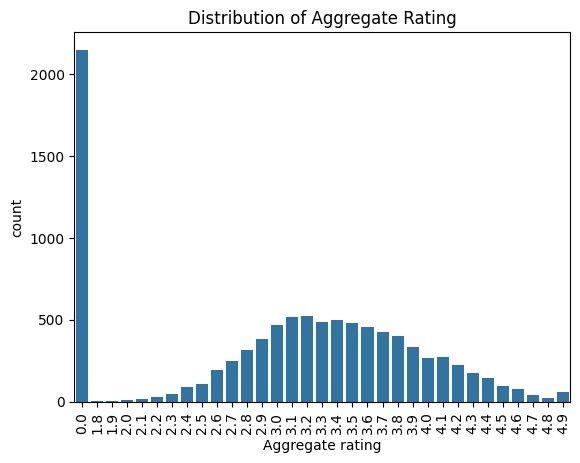

In [14]:
# Analyze the distribution of the target variable
sns.countplot(x='Aggregate rating', data=df)
plt.title('Distribution of Aggregate Rating')
plt.xticks(rotation=90)
plt.show()

In [15]:
# Identifying class imbalances
class_counts = df['Aggregate rating'].value_counts()
print("Class distribution:")
print(class_counts)

Class distribution:
0.0    2148
3.2     522
3.1     519
3.4     495
3.3     483
3.5     480
3.0     468
3.6     458
3.7     427
3.8     399
2.9     381
3.9     332
2.8     315
4.1     274
4.0     266
2.7     250
4.2     221
2.6     191
4.3     174
4.4     143
2.5     110
4.5      95
2.4      87
4.6      78
4.9      61
2.3      47
4.7      41
2.2      27
4.8      25
2.1      15
2.0       7
1.9       2
1.8       1
Name: Aggregate rating, dtype: int64


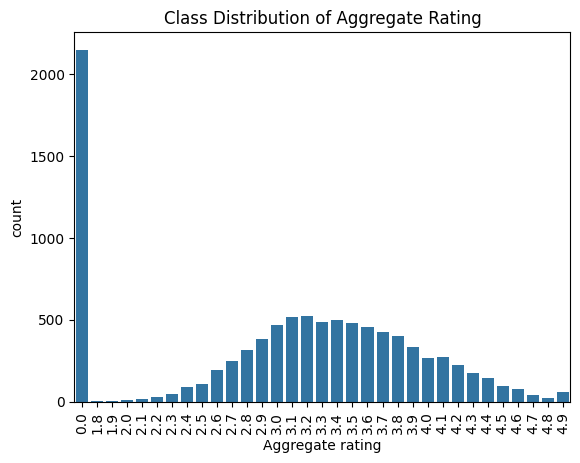

In [16]:
# Visualizing class distribution
sns.countplot(x='Aggregate rating', data=df)
plt.title('Class Distribution of Aggregate Rating')
plt.xticks(rotation=90)
plt.show()

## Task 2: Descriptive Analysis

In [17]:
# stats behind our dataframe
df.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.542000e+03,9542.000000,9542.000000,9542.000000,9542.000000,9542.000000,9542.000000,9542.000000
mean,9.043301e+06,18.179208,64.274997,25.848532,1200.326137,1.804968,2.665238,156.772060
std,8.791967e+06,56.451600,41.197602,11.010094,16128.743876,0.905563,1.516588,430.203324
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019312e+05,1.000000,77.081565,28.478658,250.000000,1.000000,2.500000,5.000000
50%,6.002726e+06,1.000000,77.192031,28.570444,400.000000,2.000000,3.200000,31.000000
75%,1.835260e+07,1.000000,77.282043,28.642711,700.000000,2.000000,3.700000,130.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


In [18]:
# Descriptive statistics for numerical columns
numerical_stats = df.describe()
print("Descriptive Statistics for Numerical Columns:")
print(numerical_stats)

Descriptive Statistics for Numerical Columns:
       Restaurant ID  Country Code    Longitude     Latitude  \
count   9.542000e+03   9542.000000  9542.000000  9542.000000   
mean    9.043301e+06     18.179208    64.274997    25.848532   
std     8.791967e+06     56.451600    41.197602    11.010094   
min     5.300000e+01      1.000000  -157.948486   -41.330428   
25%     3.019312e+05      1.000000    77.081565    28.478658   
50%     6.002726e+06      1.000000    77.192031    28.570444   
75%     1.835260e+07      1.000000    77.282043    28.642711   
max     1.850065e+07    216.000000   174.832089    55.976980   

       Average Cost for two  Price range  Aggregate rating         Votes  
count           9542.000000  9542.000000       9542.000000   9542.000000  
mean            1200.326137     1.804968          2.665238    156.772060  
std            16128.743876     0.905563          1.516588    430.203324  
min                0.000000     1.000000          0.000000      0.000000  
25

Distribution of categorical variables: Country Code, City, Cuisines

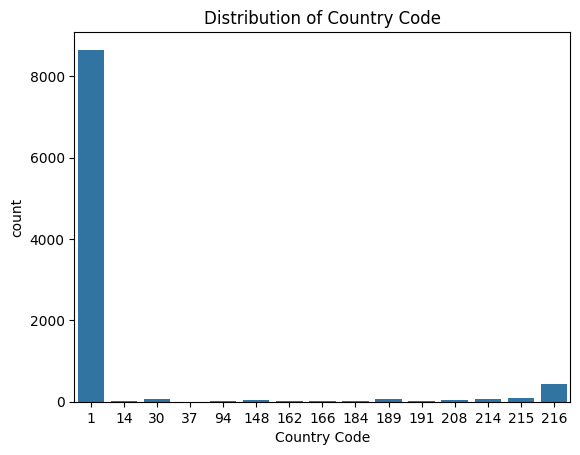

In [19]:
# Distribution of Country Code
sns.countplot(x='Country Code', data=df)
plt.title('Distribution of Country Code')
plt.show()

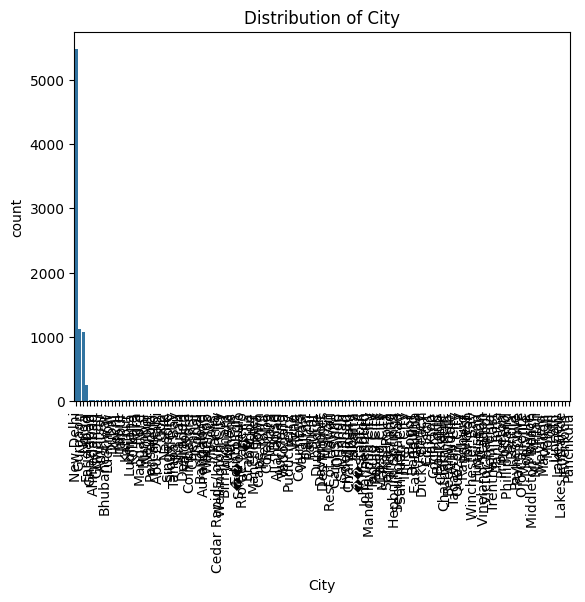

In [20]:
# Distribution of City
sns.countplot(x='City', data=df, order=df['City'].value_counts().index)
plt.title('Distribution of City')
plt.xticks(rotation=90)
plt.show()

In [21]:
# Distribution of Cuisines
cuisine_counts = df['Cuisines'].value_counts()
print("Top 10 Cuisines:")
print(cuisine_counts)

Top 10 Cuisines:
North Indian                                             936
North Indian, Chinese                                    511
Chinese                                                  354
Fast Food                                                354
North Indian, Mughlai                                    334
                                                        ... 
Bengali, Fast Food                                         1
North Indian, Rajasthani, Asian                            1
Chinese, Thai, Malaysian, Indonesian                       1
Bakery, Desserts, North Indian, Bengali, South Indian      1
Italian, World Cuisine                                     1
Name: Cuisines, Length: 1825, dtype: int64


In [22]:
# Display top 10 cuisines
cuisine_counts.head(10)

North Indian                      936
North Indian, Chinese             511
Chinese                           354
Fast Food                         354
North Indian, Mughlai             334
Cafe                              299
Bakery                            218
North Indian, Mughlai, Chinese    197
Bakery, Desserts                  170
Street Food                       149
Name: Cuisines, dtype: int64

In [23]:
# Identify the top cities with the highest number of restaurants
top_cities = df['City'].value_counts()
print("Top Cities with the Highest Number of Restaurants:")
print(top_cities)

Top Cities with the Highest Number of Restaurants:
New Delhi         5473
Gurgaon           1118
Noida             1080
Faridabad          251
Ghaziabad           25
                  ... 
Lincoln              1
Lakeview             1
Lakes Entrance       1
Inverloch            1
Panchkula            1
Name: City, Length: 140, dtype: int64


In [24]:
# Top 10 cities with the highest number of restaurants
top_cities.head(10)

New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Ahmedabad         21
Guwahati          21
Amritsar          21
Bhubaneshwar      21
Lucknow           21
Name: City, dtype: int64

## Task 3: Geospatial Analysis

In [25]:
import folium

In [26]:
# Visualizing locations of restaurants on a map
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]  # Center the map based on average latitude and longitude
restaurant_map = folium.Map(location=map_center, zoom_start=12)

# Add markers for each restaurant
for index, row in df.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], popup=row['Restaurant Name']).add_to(restaurant_map)

In [27]:
# You can also Save the map to an HTML file
# restaurant_map.save('restaurant_map.html')

In [28]:
restaurant_map

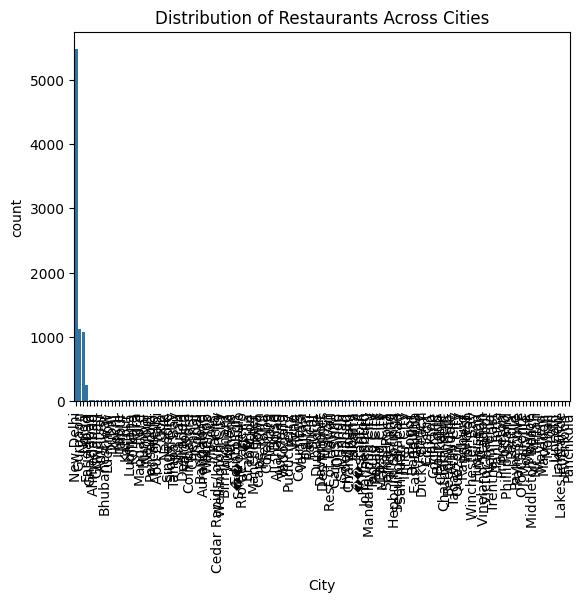

In [29]:
# Distribution of restaurants across different cities or countries
sns.countplot(x='City', data=df, order=df['City'].value_counts().index)
plt.title('Distribution of Restaurants Across Cities')
plt.xticks(rotation=90)
plt.show()

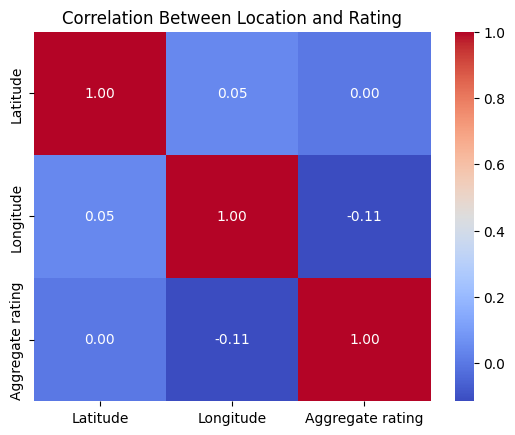

In [30]:
# Correlation between restaurant's location and its rating
correlation = df[['Latitude', 'Longitude', 'Aggregate rating']].corr()
sns.heatmap(correlation, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Between Location and Rating')
plt.show()

# Level 2

## Task 1: Task: Table Booking and Online Delivery

In [31]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9542 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9542 non-null   int64  
 1   Restaurant Name       9542 non-null   object 
 2   Country Code          9542 non-null   int64  
 3   City                  9542 non-null   object 
 4   Address               9542 non-null   object 
 5   Locality              9542 non-null   object 
 6   Locality Verbose      9542 non-null   object 
 7   Longitude             9542 non-null   float64
 8   Latitude              9542 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9542 non-null   int64  
 11  Currency              9542 non-null   object 
 12  Has Table booking     9542 non-null   object 
 13  Has Online delivery   9542 non-null   object 
 14  Is delivering now     9542 non-null   object 
 15  Switch to order menu 

In [32]:
# Determining percentage of restaurants that offer table booking and online delivery
table_booking_percentage = (df['Has Table booking'].value_counts(normalize=True)['Yes']) * 100
online_delivery_percentage = (df['Has Online delivery'].value_counts(normalize=True)['Yes']) * 100

print(f"Percentage of restaurants offering table booking: {table_booking_percentage:.2f}%")     #formatting
print(f"Percentage of restaurants offering online delivery: {online_delivery_percentage:.2f}%") #formatting

Percentage of restaurants offering table booking: 12.14%
Percentage of restaurants offering online delivery: 25.69%


In [33]:
# Comparing average ratings of restaurants with and without table booking
avg_rtg_with_booking = df[df['Has Table booking'] == 'Yes']['Aggregate rating'].mean()
avg_rtg_without_booking = df[df['Has Table booking'] == 'No']['Aggregate rating'].mean()

print(f"Average rating of restaurants with table booking: {avg_rtg_with_booking:.2f}")        #formatting
print(f"Average rating of restaurants without table booking: {avg_rtg_without_booking:.2f}")  #formatting

Average rating of restaurants with table booking: 3.44
Average rating of restaurants without table booking: 2.56


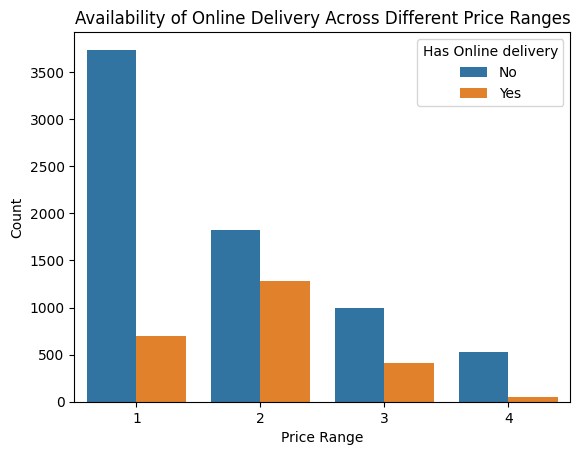

In [34]:
# Analyzing the availability of online delivery among restaurants with different price ranges
sns.countplot(x='Price range', hue='Has Online delivery', data=df)
plt.title('Availability of Online Delivery Across Different Price Ranges')
plt.xlabel('Price Range')
plt.ylabel('Count')
plt.show()

## Task 2: Price Range Analysis

In [35]:
# Determining the most common price range among all the restaurants
most_common_price_range = df['Price range'].mode().values[0]
print(f"Most common price range: {most_common_price_range}")

Most common price range: 1


In [36]:
# Calculating the average rating for each price range
avg_rtg_by_price_range = df.groupby('Price range')['Aggregate rating'].mean().sort_values(ascending=False)
print("Average rating for each price range:")
print(avg_rtg_by_price_range)

Average rating for each price range:
Price range
4    3.817918
3    3.682633
2    2.941054
1    1.997476
Name: Aggregate rating, dtype: float64


In [37]:
# Identifying the color that represents the highest average rating among different price ranges
highest_rating_price_range = avg_rtg_by_price_range.idxmax()
print(f"Price range with the highest average rating: {highest_rating_price_range}")

Price range with the highest average rating: 4


<ipython-input-38-b228c817fadd>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Price range', y='Aggregate rating', data=df, order=avg_rtg_by_price_range.index, palette='viridis')


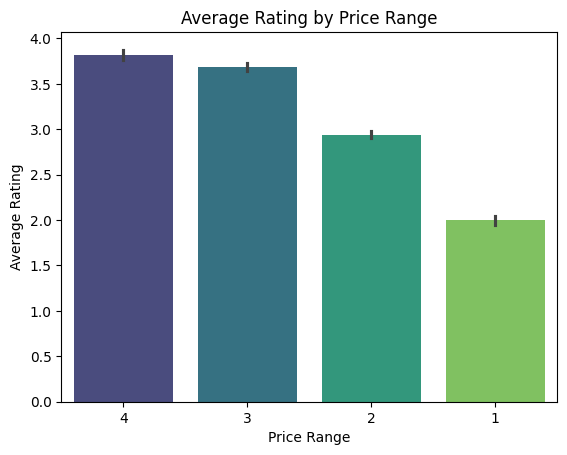

In [38]:
# Plot a bar chart to visualize average ratings by price range
sns.barplot(x='Price range', y='Aggregate rating', data=df, order=avg_rtg_by_price_range.index, palette='viridis')
plt.title('Average Rating by Price Range')
plt.xlabel('Price Range')
plt.ylabel('Average Rating')
plt.show()

## Task 3: Feature Engineering

In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9542 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9542 non-null   int64  
 1   Restaurant Name       9542 non-null   object 
 2   Country Code          9542 non-null   int64  
 3   City                  9542 non-null   object 
 4   Address               9542 non-null   object 
 5   Locality              9542 non-null   object 
 6   Locality Verbose      9542 non-null   object 
 7   Longitude             9542 non-null   float64
 8   Latitude              9542 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9542 non-null   int64  
 11  Currency              9542 non-null   object 
 12  Has Table booking     9542 non-null   object 
 13  Has Online delivery   9542 non-null   object 
 14  Is delivering now     9542 non-null   object 
 15  Switch to order menu 

In [40]:
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [41]:
# Extracting additional features
df['Restaurant Name Length'] = df['Restaurant Name'].apply(len)
df['Address Length'] = df['Address'].apply(len)

In [42]:
# Create new features by encoding categorical variables
df['Has Table Booking'] = df['Has Table booking'].map({'Yes': 1, 'No': 0})
df['Has Online Delivery'] = df['Has Online delivery'].map({'Yes': 1, 'No': 0})

In [43]:
# Display the updated DataFrame
print(df.head())

   Restaurant ID         Restaurant Name  Country Code              City  \
0        6317637        Le Petit Souffle           162       Makati City   
1        6304287        Izakaya Kikufuji           162       Makati City   
2        6300002  Heat - Edsa Shangri-La           162  Mandaluyong City   
3        6318506                    Ooma           162  Mandaluyong City   
4        6314302             Sambo Kojin           162  Mandaluyong City   

                                             Address  \
0  Third Floor, Century City Mall, Kalayaan Avenu...   
1  Little Tokyo, 2277 Chino Roces Avenue, Legaspi...   
2  Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...   
3  Third Floor, Mega Fashion Hall, SM Megamall, O...   
4  Third Floor, Mega Atrium, SM Megamall, Ortigas...   

                                     Locality  \
0   Century City Mall, Poblacion, Makati City   
1  Little Tokyo, Legaspi Village, Makati City   
2  Edsa Shangri-La, Ortigas, Mandaluyong City   
3      SM 

# Level 3

## Task 1: Predictive Modeling

In [44]:
# Import necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import accuracy_score

In [45]:
# import sklearn function 'LabelEncoder' for converting categorical values into numberic
from sklearn.preprocessing import LabelEncoder

# make a variable for LabelEncoder function
label_encoder = LabelEncoder()

In [46]:
# label encoding of 'Cuisines' column in dataframe
df['Cuisines'] = label_encoder.fit_transform(df['Cuisines'])

In [47]:
# label encoding of 'City' column in dataframe
df['City'] = label_encoder.fit_transform(df['City'])

In [48]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9542 entries, 0 to 9550
Data columns (total 25 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Restaurant ID           9542 non-null   int64  
 1   Restaurant Name         9542 non-null   object 
 2   Country Code            9542 non-null   int64  
 3   City                    9542 non-null   int64  
 4   Address                 9542 non-null   object 
 5   Locality                9542 non-null   object 
 6   Locality Verbose        9542 non-null   object 
 7   Longitude               9542 non-null   float64
 8   Latitude                9542 non-null   float64
 9   Cuisines                9542 non-null   int64  
 10  Average Cost for two    9542 non-null   int64  
 11  Currency                9542 non-null   object 
 12  Has Table booking       9542 non-null   object 
 13  Has Online delivery     9542 non-null   object 
 14  Is delivering now       9542 non-null   

In [49]:
df.corr()

<ipython-input-49-2f6f6606aa2c>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,Restaurant ID,Country Code,City,Longitude,Latitude,Cuisines,Average Cost for two,Price range,Aggregate rating,Votes,Restaurant Name Length,Address Length,Has Table Booking,Has Online Delivery
Restaurant ID,1.000000,0.146270,-0.004876,-0.224362,-0.052626,-0.079240,-0.001629,-0.134528,-0.327160,-0.147434,-0.030088,-0.093869,-0.109794,-0.084615
Country Code,0.146270,1.000000,-0.178454,-0.694629,0.018049,-0.135727,0.043717,0.245363,0.281295,0.154361,0.063982,-0.122779,-0.060815,-0.153581
City,-0.004876,-0.178454,1.000000,0.114510,-0.004607,0.026584,-0.028306,-0.104848,-0.130848,-0.078513,0.007116,0.035616,-0.004039,0.011926
Longitude,-0.224362,-0.694629,0.114510,1.000000,0.045415,0.129325,0.045948,-0.080257,-0.114733,-0.084371,-0.070855,0.156037,0.099860,0.177922
Latitude,-0.052626,0.018049,-0.004607,0.045415,1.000000,0.037841,-0.111080,-0.166735,0.000197,-0.022914,0.040797,-0.049385,0.054874,0.119087
Cuisines,-0.079240,-0.135727,0.026584,0.129325,0.037841,1.000000,0.005875,-0.005265,-0.080832,-0.032935,0.061958,0.066128,0.050867,-0.016303
Average Cost for two,-0.001629,0.043717,-0.028306,0.045948,-0.111080,0.005875,1.000000,0.075111,0.051864,0.067833,-0.004173,-0.001445,0.007733,-0.019017
Price range,-0.134528,0.245363,-0.104848,-0.080257,-0.166735,-0.005265,0.075111,1.000000,0.438356,0.309474,0.062452,0.067928,0.502166,0.077887
Aggregate rating,-0.327160,0.281295,-0.130848,-0.114733,0.000197,-0.080832,0.051864,0.438356,1.000000,0.313474,-0.035282,0.003068,0.190351,0.226250
Votes,-0.147434,0.154361,-0.078513,-0.084371,-0.022914,-0.032935,0.067833,0.309474,0.313474,1.000000,-0.018772,0.009011,0.169619,0.074532


In [50]:
# Define features (X) and target variable (y)
# Neglecting non-numeric columns
# Neglecting Numeric Columns that has no depencies on target column such as "Latitude","Address Length"

X = df[['Restaurant ID','Country Code','City','Longitude','Cuisines','Average Cost for two','Price range','Votes','Restaurant Name Length','Has Table Booking','Has Online Delivery']]
y = df['Aggregate rating']

In [51]:
# Splitting the dataset into training and testing sets
# The best ratio to split tha data is 80-20%, to create validation set for machine learning model

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [52]:
# shape of all training and testing data variables
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((7633, 11), (1909, 11), (7633,), (1909,))

In [53]:
# making an object for all machine-learning algorithms

In [54]:
# Linear regression model
lr = LinearRegression()
lr.fit(X_train, y_train)
lr_predictions = lr.predict(X_test)

# Decision tree regression model
dtree = DecisionTreeRegressor(random_state=42)
dtree.fit(X_train, y_train)
dtree_predictions = dtree.predict(X_test)

# Random forest regression model
rfc = RandomForestRegressor(random_state=42)
rfc.fit(X_train, y_train)
rfc_predictions = rfc.predict(X_test)

# Evaluate model performance
def evaluate_model(predictions, actual):
    mse = mean_squared_error(actual, predictions)
    r2 = r2_score(actual, predictions)
    return mse, r2

linear_mse, linear_r2 = evaluate_model(lr_predictions, y_test)
tree_mse, tree_r2 = evaluate_model(dtree_predictions, y_test)
forest_mse, forest_r2 = evaluate_model(rfc_predictions, y_test)

print("Linear Regression:")
print(f"Mean Squared Error: {linear_mse:.2f}")
print(f"R-squared: {linear_r2:.2f}")

print("\nDecision Tree Regression:")
print(f"Mean Squared Error: {tree_mse:.2f}")
print(f"R-squared: {tree_r2:.2f}")

print("\nRandom Forest Regression:")
print(f"Mean Squared Error: {forest_mse:.2f}")
print(f"R-squared: {forest_r2:.2f}")

Linear Regression:
Mean Squared Error: 1.34
R-squared: 0.42

Decision Tree Regression:
Mean Squared Error: 0.15
R-squared: 0.93

Random Forest Regression:
Mean Squared Error: 0.07
R-squared: 0.97


In [55]:
# Based on above results, both Decision Tree Regression and Random Forest Regression have better performance compared to Linear Regression.
# They exhibit lower MSE and higher R-squared values.
# MSE: The lower the MSE, the better.
# R-squared: The higher the R-squared, the better.
# Random Forest Regressor, the best model for prediction

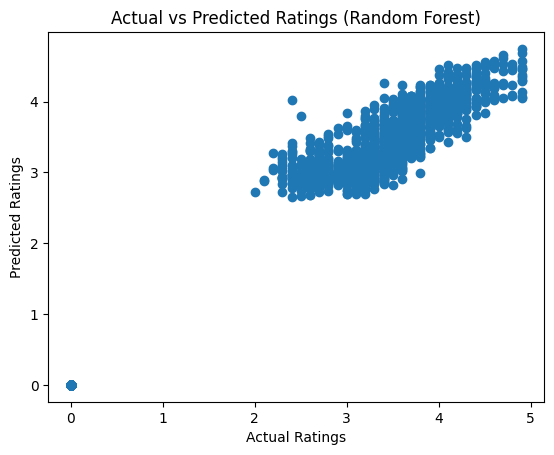

In [56]:
# Visualizing actual vs predicted ratings for random forest model
plt.scatter(y_test, rfc_predictions)
plt.xlabel('Actual Ratings')
plt.ylabel('Predicted Ratings')
plt.title('Actual vs Predicted Ratings (Random Forest)')
plt.show()

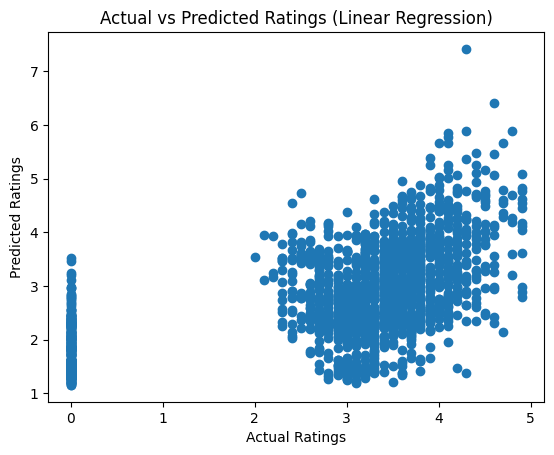

In [57]:
# Visualizing actual vs predicted ratings for Linear Regression Model
plt.scatter(y_test, lr_predictions)
plt.xlabel('Actual Ratings')
plt.ylabel('Predicted Ratings')
plt.title('Actual vs Predicted Ratings (Linear Regression)')
plt.show()

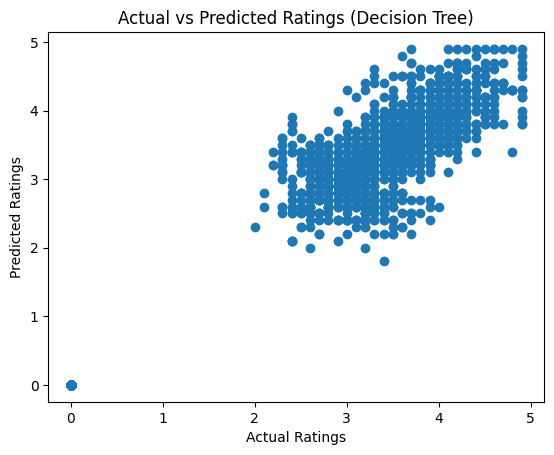

In [58]:
# Visualizing actual vs predicted ratings for Decision Tree Model
plt.scatter(y_test, dtree_predictions)
plt.xlabel('Actual Ratings')
plt.ylabel('Predicted Ratings')
plt.title('Actual vs Predicted Ratings (Decision Tree)')
plt.show()

## Task 2:- Customer Preference Analysis

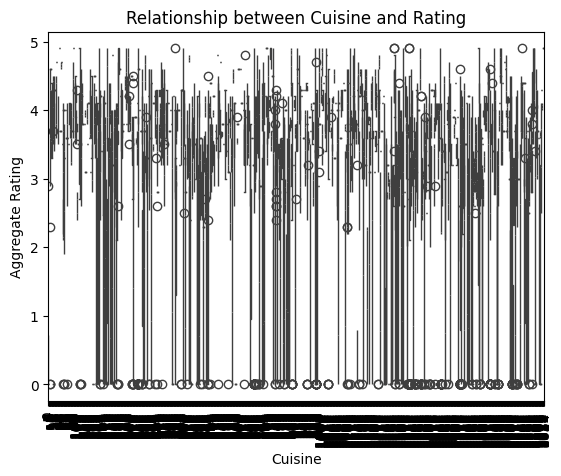

In [59]:
# Analyzing the relationship between cuisine and rating
sns.boxplot(x='Cuisines', y='Aggregate rating', data=df)
plt.title('Relationship between Cuisine and Rating')
plt.xlabel('Cuisine')
plt.ylabel('Aggregate Rating')
plt.xticks(rotation=90)
plt.show()

In [60]:
# Identifying the most popular cuisines based on the number of votes
popular_cuisines = df.groupby('Cuisines')['Votes'].sum().sort_values(ascending=False).head(10)
print("Top 10 Most Popular Cuisines based on Votes:")
print(popular_cuisines)

Top 10 Most Popular Cuisines based on Votes:
Cuisines
1514    53747
1306    46241
1329    42012
331     30657
497     21925
1520    20115
828     17852
1699    16433
1288    15275
1031    14799
Name: Votes, dtype: int64


In [61]:
# Determining if there are any specific cuisines that tend to receive higher ratings
avg_rtg_by_cuisine = df.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=False)
print("Average Rating for each Cuisine:")
print(avg_rtg_by_cuisine)

Average Rating for each Cuisine:
Cuisines
1062    4.9
949     4.9
93      4.9
683     4.9
796     4.9
       ... 
850     0.0
844     0.0
415     0.0
1687    0.0
864     0.0
Name: Aggregate rating, Length: 1825, dtype: float64


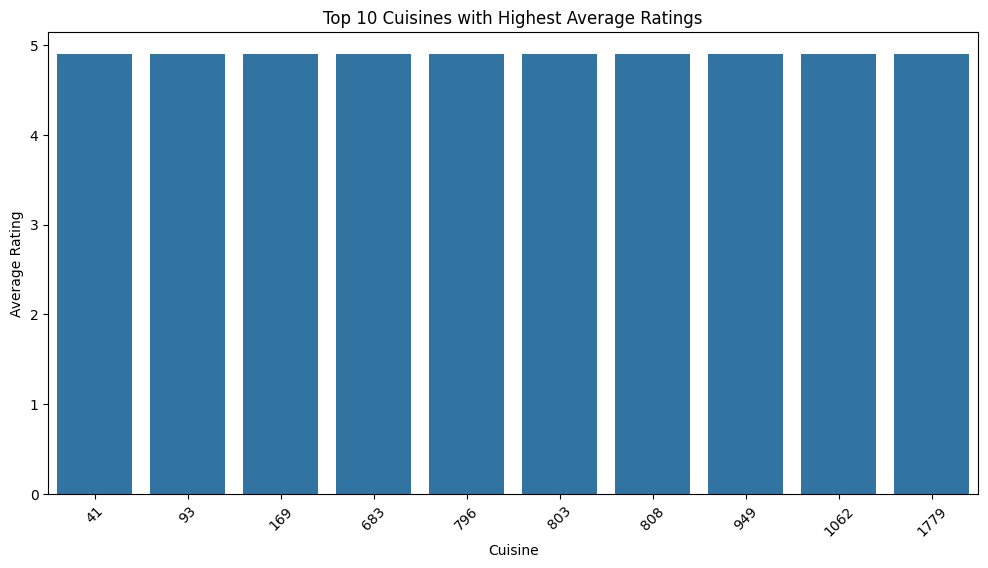

In [62]:
# Visualizing the average ratings for the top cuisines
top_cuisines = avg_rtg_by_cuisine.head(10)
plt.figure(figsize=(12, 6))
sns.barplot(x=top_cuisines.index, y=top_cuisines.values)
plt.title('Top 10 Cuisines with Highest Average Ratings')
plt.xlabel('Cuisine')
plt.ylabel('Average Rating')
plt.xticks(rotation=45)
plt.show()

## Task 3: Data Visualization

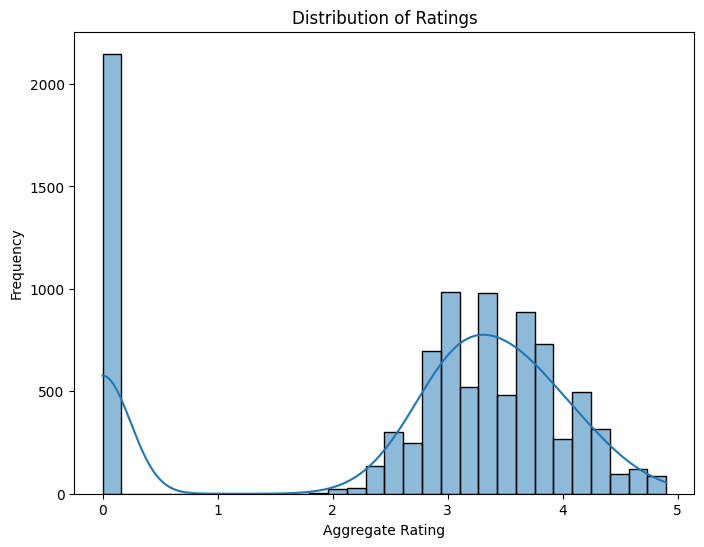

In [63]:
# Distribution of ratings using a histogram
plt.figure(figsize=(8, 6))
sns.histplot(df['Aggregate rating'], bins=30, kde=True)
plt.title('Distribution of Ratings')
plt.xlabel('Aggregate Rating')
plt.ylabel('Frequency')
plt.show()

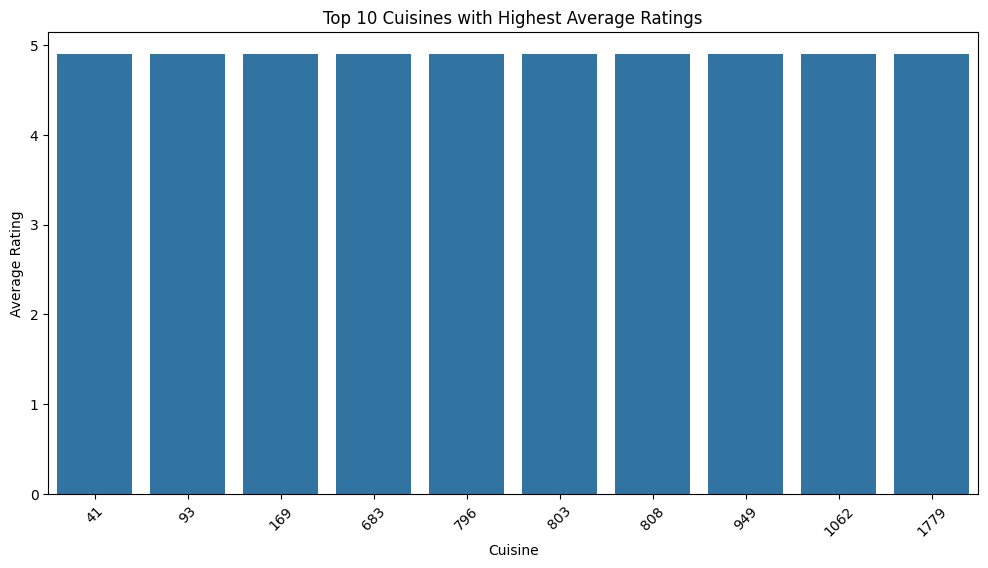

In [64]:
# Comparing average ratings of different cuisines using a bar plot
average_rating_by_cuisine = df.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=False).head(10)
plt.figure(figsize=(12, 6))
sns.barplot(x=average_rating_by_cuisine.index, y=average_rating_by_cuisine.values)
plt.title('Top 10 Cuisines with Highest Average Ratings')
plt.xlabel('Cuisine')
plt.ylabel('Average Rating')
plt.xticks(rotation=45)
plt.show()

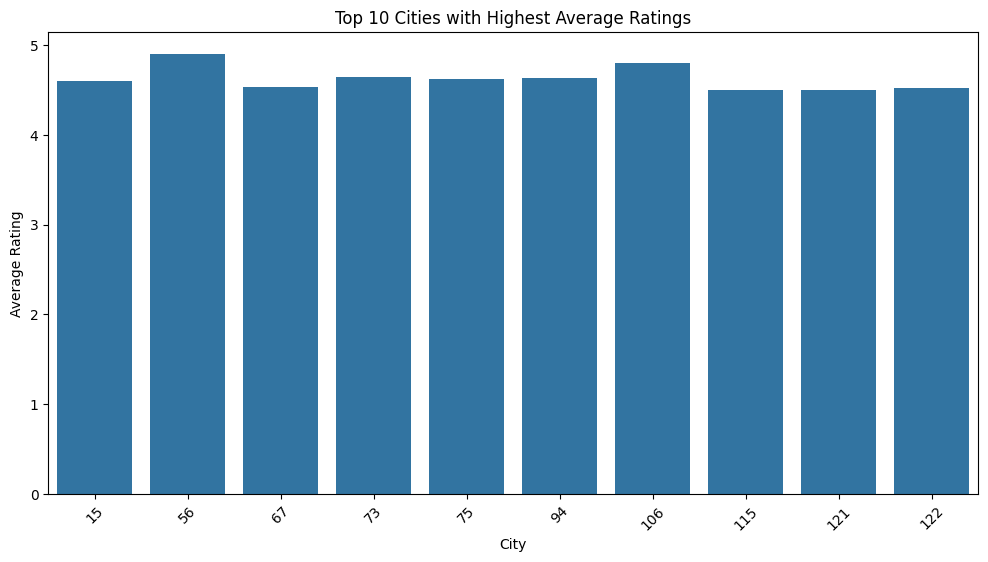

In [65]:
# Comparing average ratings of different cities using a bar plot
average_rating_by_city = df.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False).head(10)
plt.figure(figsize=(12, 6))
sns.barplot(x=average_rating_by_city.index, y=average_rating_by_city.values)
plt.title('Top 10 Cities with Highest Average Ratings')
plt.xlabel('City')
plt.ylabel('Average Rating')
plt.xticks(rotation=45)
plt.show()

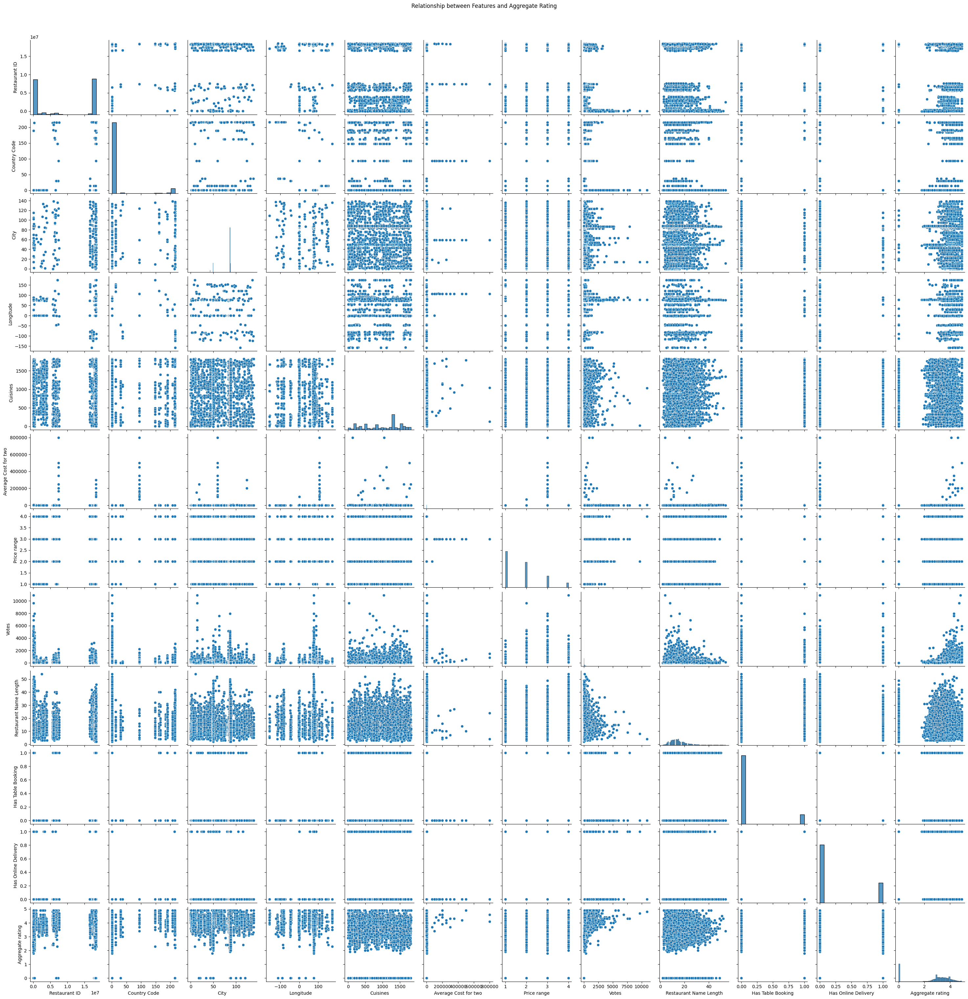

In [66]:
# Visualizing the relationship between features and the target variable using scatter plots
sns.pairplot(df[['Restaurant ID','Country Code','City','Longitude','Cuisines','Average Cost for two','Price range','Votes','Restaurant Name Length','Has Table Booking','Has Online Delivery','Aggregate rating']])
plt.suptitle('Relationship between Features and Aggregate Rating', y=1.02)
plt.show()

# Finish